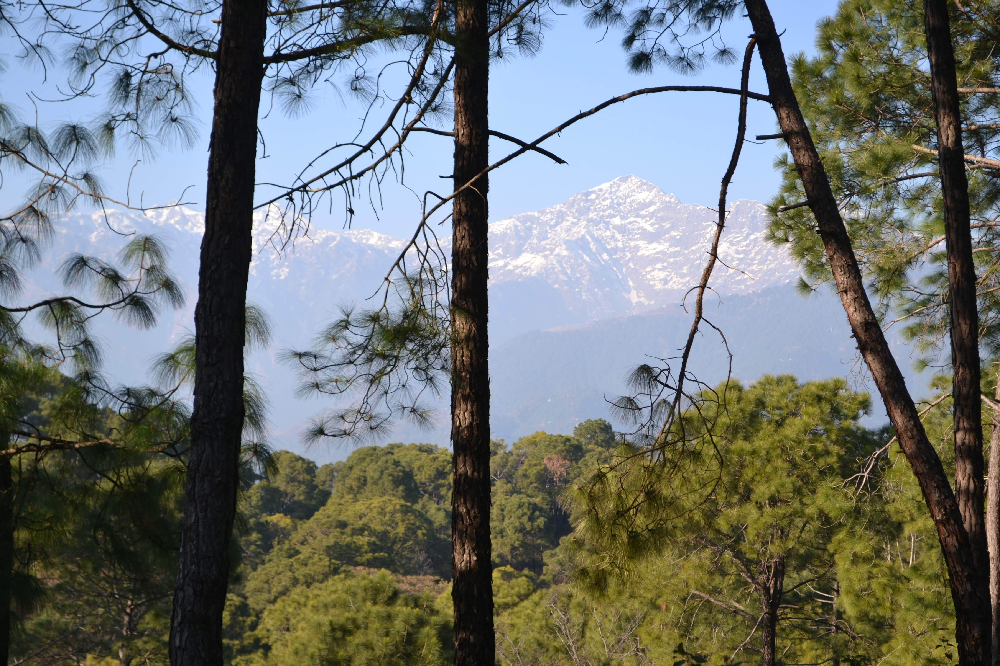

(3072, 4608, 3)


In [16]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

num_down = 2 # no of downsampling steps needed
num_bilateral = 7 #bilateral filtering steps

img_rgb = cv2.imread("/content/DSC_1056.JPG")
cv2_imshow(img_rgb)
print(img_rgb.shape)



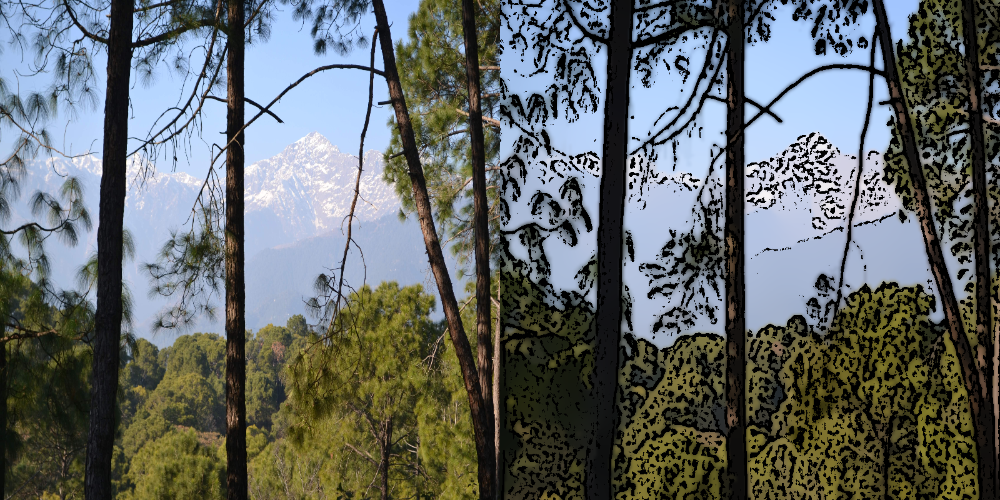

-1

In [19]:
#resize the image for optimal solution
img_rgb = cv2.resize(img_rgb , (800,800))
img_color = img_rgb

#downsampling img using gausian pyramid
for i in range(num_down):
  img_color = cv2.pyrDown(img_color)

#repeat downsample to retain resol.
for _ in range(num_bilateral):
  img_color = cv2.bilateralFilter(img_color, d=9, sigmaColor=9, sigmaSpace=7)  

#upsample image to original size
for _ in range(num_down):
  img_color = cv2.pyrUp(img_color)

img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
img_blur = cv2.medianBlur(img_gray, 7)
img_edge = cv2.adaptiveThreshold(img_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blockSize=9, C=2)

#convert back to color, bit-AND with color image
img_edge = cv2.cvtColor(img_edge, cv2.COLOR_GRAY2RGB)
img_cartoon = cv2.bitwise_and(img_color, img_edge)

#display
#cv2_imshow(img_cartoon)
stack = np.hstack([img_rgb, img_cartoon])
cv2_imshow(stack)
cv2.waitKey(0)